In [2]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt


df = pd.read_csv('/content/train_Df64byy.csv')
test_df = pd.read_csv('/content/test_YCcRUnU.csv')
df.head()

,ID,City_Code,Region_Code,Accomodation_Type,Reco_Insurance_Type,Upper_Age,Lower_Age,Is_Spouse,Health Indicator,Holding_Policy_Duration,Holding_Policy_Type,Reco_Policy_Cat,Reco_Policy_Premium,Response
0,1,C3,3213,Rented,Individual,36,36,No,X1,14+,3.0,22,11628.0,0
1,2,C5,1117,Owned,Joint,75,22,No,X2,NaN,NaN,22,30510.0,0
2,3,C5,3732,Owned,Individual,32,32,No,NaN,1.0,1.0,19,7450.0,1
3,4,C24,4378,Owned,Joint,52,48,No,X1,14+,3.0,19,17780.0,0
4,5,C8,2190,Rented,Individual,44,44,No,X2,3.0,1.0,16,10404.0,0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50882 entries, 0 to 50881
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   ID                       50882 non-null  int64  
 1   City_Code                50882 non-null  object 
 2   Region_Code              50882 non-null  int64  
 3   Accomodation_Type        50882 non-null  object 
 4   Reco_Insurance_Type      50882 non-null  object 
 5   Upper_Age                50882 non-null  int64  
 6   Lower_Age                50882 non-null  int64  
 7   Is_Spouse                50882 non-null  object 
 8   Health Indicator         39191 non-null  object 
 9   Holding_Policy_Duration  30631 non-null  object 
 10  Holding_Policy_Type      30631 non-null  float64
 11  Reco_Policy_Cat          50882 non-null  int64  
 12  Reco_Policy_Premium      50882 non-null  float64
 13  Response                 50882 non-null  int64  
dtypes: float64(2), int64(6

In [4]:
df.Response.value_counts()

0    38673
1    12209
Name: Response, dtype: int64

In [5]:
len(df.City_Code.unique())

36

In [6]:
df.Accomodation_Type.value_counts()

Owned     27951
Rented    22931
Name: Accomodation_Type, dtype: int64

In [7]:
len(df.Region_Code.unique())

5316

In [8]:
nulls = df.isnull().sum(axis=0)
for idx in nulls.index:
  if nulls[idx]!= 0:
    print(idx,end=': ')
    print(nulls[idx])

Health Indicator: 11691
Holding_Policy_Duration: 20251
Holding_Policy_Type: 20251


In [9]:
#Train
nulls_row = df.isnull().sum(axis=1)
dictt = {x:0 for x in range(4)}
for idx in nulls_row.index:
  dictt[nulls_row[idx]] += 1
print(dictt)

{0: 23548, 1: 7083, 2: 15643, 3: 4608}


In [10]:
#Test
nulls_row = test_df.isnull().sum(axis=1)
dictt = {x:0 for x in range(4)}
for idx in nulls_row.index:
  dictt[nulls_row[idx]] += 1
print(dictt)

{0: 10170, 1: 3032, 2: 6608, 3: 1995}


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


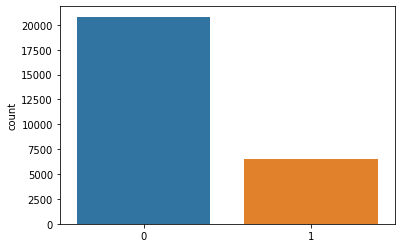

In [12]:
import seaborn as sns
#if even one missing then response
nulls_row = df.isnull().sum(axis=1)
resp = []
for idx in nulls_row.index:
   if nulls_row[idx] != 0:
    resp.append(df.iloc[idx].Response)
sns.countplot(resp)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


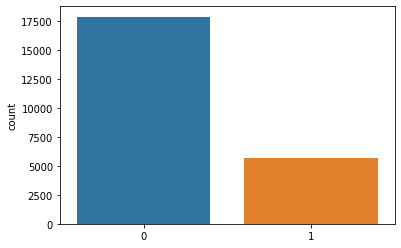

In [13]:
#if none missing then response
nulls_row = df.isnull().sum(axis=1)
resp = []
for idx in nulls_row.index:
   if nulls_row[idx] == 0:
    resp.append(df.iloc[idx].Response)
sns.countplot(resp)

In [14]:
test_df = pd.read_csv('/content/test_YCcRUnU.csv')
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21805 entries, 0 to 21804
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   ID                       21805 non-null  int64  
 1   City_Code                21805 non-null  object 
 2   Region_Code              21805 non-null  int64  
 3   Accomodation_Type        21805 non-null  object 
 4   Reco_Insurance_Type      21805 non-null  object 
 5   Upper_Age                21805 non-null  int64  
 6   Lower_Age                21805 non-null  int64  
 7   Is_Spouse                21805 non-null  object 
 8   Health Indicator         16778 non-null  object 
 9   Holding_Policy_Duration  13202 non-null  object 
 10  Holding_Policy_Type      13202 non-null  float64
 11  Reco_Policy_Cat          21805 non-null  int64  
 12  Reco_Policy_Premium      21805 non-null  float64
dtypes: float64(2), int64(5), object(6)
memory usage: 2.2+ MB


In [15]:
df.Holding_Policy_Type.value_counts()

3.0    13279
1.0     8173
2.0     5005
4.0     4174
Name: Holding_Policy_Type, dtype: int64

In [16]:
df.Holding_Policy_Duration.value_counts()

1.0     4499
14+     4335
2.0     4260
3.0     3586
4.0     2771
5.0     2362
6.0     1894
7.0     1645
8.0     1316
9.0     1114
10.0     813
11.0     546
12.0     513
13.0     511
14.0     466
Name: Holding_Policy_Duration, dtype: int64

In [17]:
df['Health Indicator'].value_counts()

X1    13010
X2    10332
X3     6762
X4     5743
X5     1727
X6     1280
X7      196
X8       78
X9       63
Name: Health Indicator, dtype: int64

In [2]:
df['Diff'] = df.Upper_Age - df.Lower_Age

In [26]:
len(df.Region_Code.unique())

5316

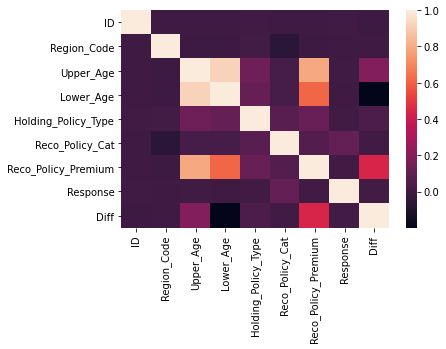

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.heatmap(df.corr())

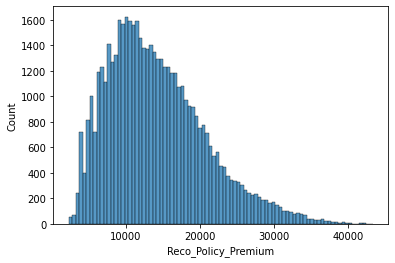

In [31]:
sns.histplot(df.Reco_Policy_Premium,)# hue=df.Response)

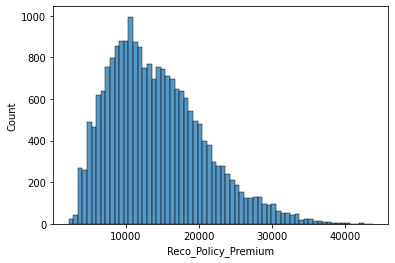

In [32]:
sns.histplot(test_df.Reco_Policy_Premium,)

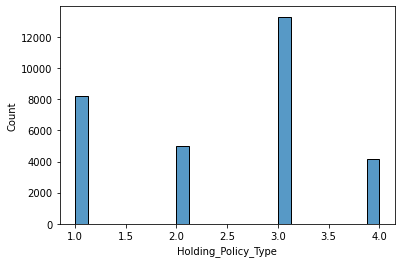

In [33]:
sns.histplot(df.Holding_Policy_Type,)

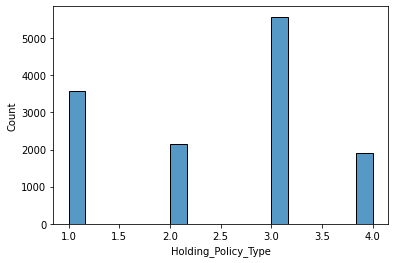

In [35]:
sns.histplot(test_df.Holding_Policy_Type,)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


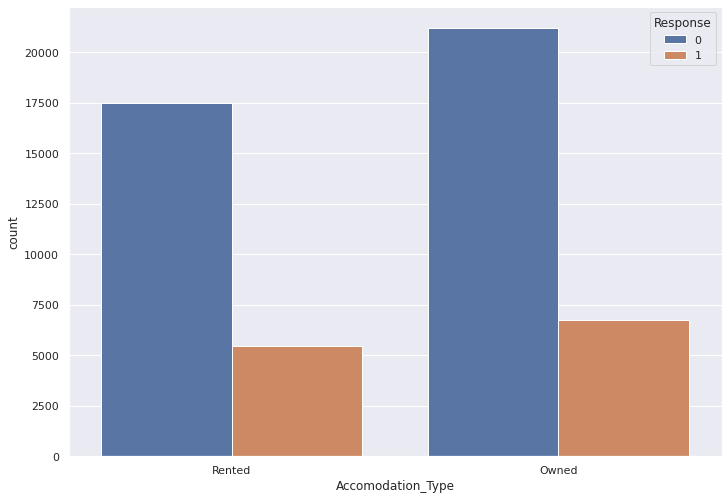

In [110]:
sns.countplot(df.Accomodation_Type, hue=df.Response)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


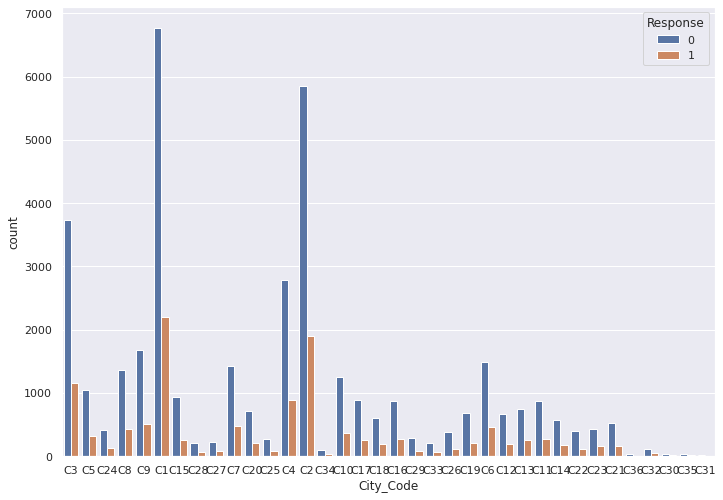

In [109]:
sns.countplot(df.City_Code, hue=df.Response)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


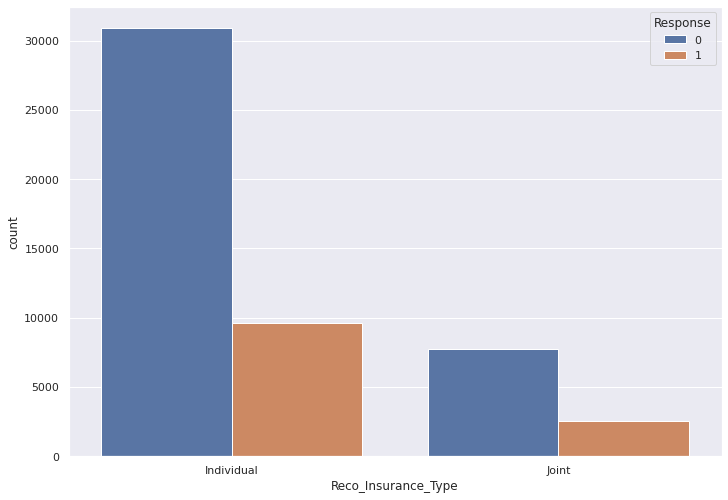

In [113]:
sns.countplot(df.Reco_Insurance_Type, hue=df.Response)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


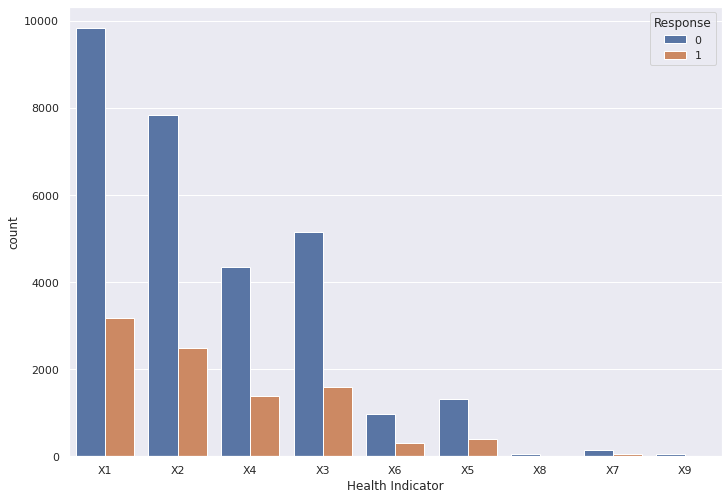

In [114]:
sns.countplot(df['Health Indicator'], hue=df.Response)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


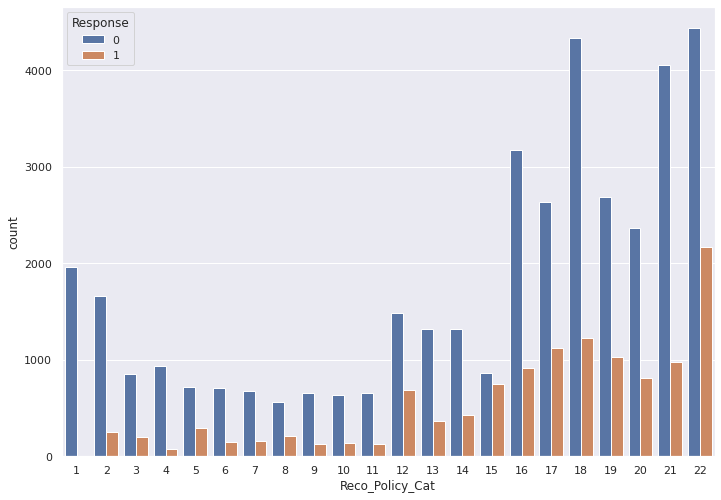

In [115]:
sns.countplot(df.Reco_Policy_Cat, hue=df.Response)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


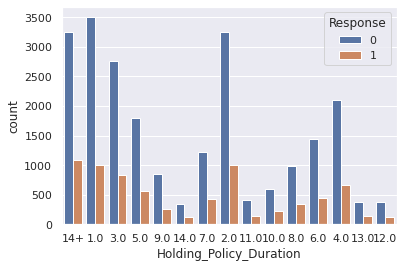

In [37]:
sns.countplot(df.Holding_Policy_Duration, hue=df.Response)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


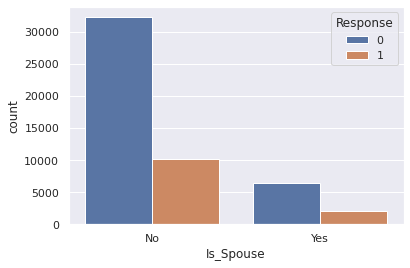

In [28]:
sns.countplot(df.Is_Spouse, hue=df.Response)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


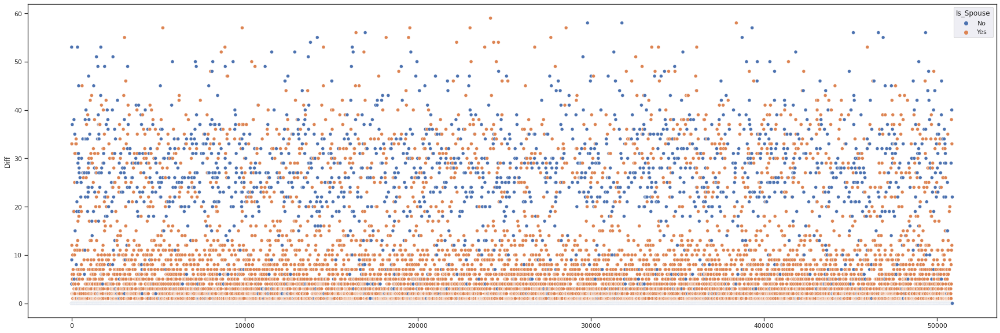

In [31]:
sns.set_style('ticks')
fig, ax = plt.subplots()
fig.set_size_inches(30, 10)
sns.set_theme(style="darkgrid")
sns.scatterplot(df.index, df.Diff, hue=df.Is_Spouse)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


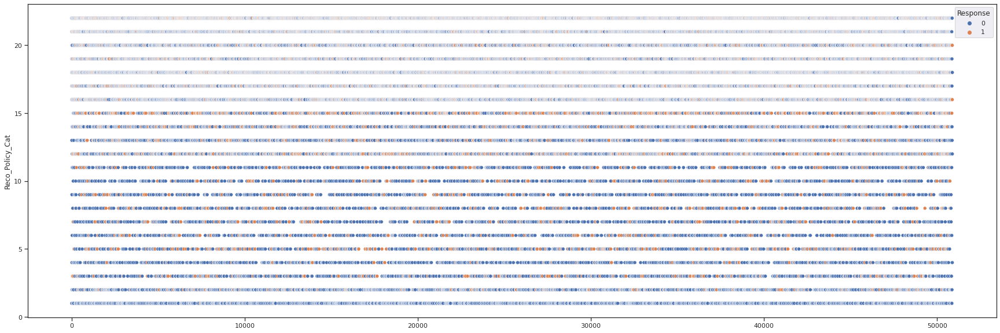

In [45]:
sns.set_style('ticks')
fig, ax = plt.subplots()
fig.set_size_inches(30, 10)
sns.set_theme(style="darkgrid")
sns.scatterplot(df.index, df.Reco_Policy_Cat, hue=df.Response)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


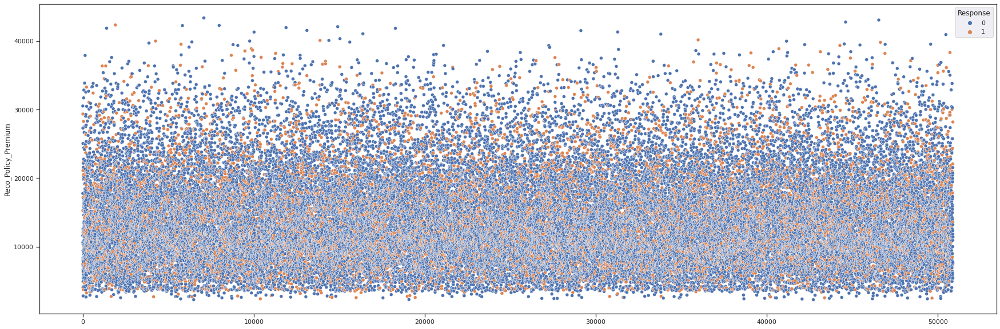

In [46]:
sns.set_style('ticks')
fig, ax = plt.subplots()
fig.set_size_inches(30, 10)
sns.set_theme(style="darkgrid")
sns.scatterplot(df.index, df.Reco_Policy_Premium, hue=df.Response, )

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


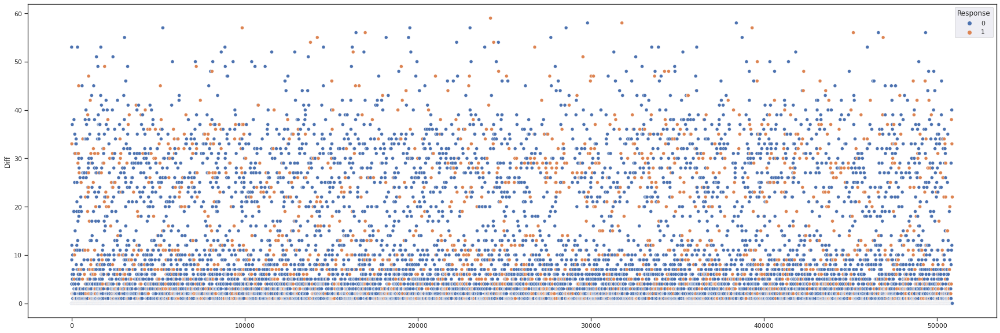

In [47]:
sns.set_style('ticks')
fig, ax = plt.subplots()
fig.set_size_inches(30, 10)
sns.set_theme(style="darkgrid")
sns.scatterplot(df.index, df.Diff, hue=df.Response)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


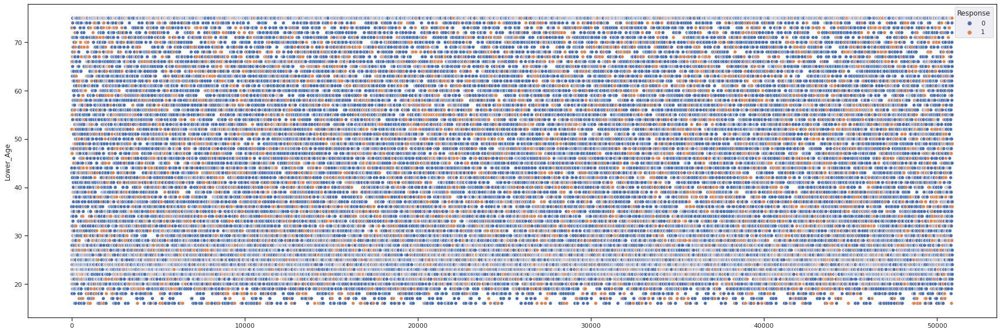

In [48]:
sns.set_style('ticks')
fig, ax = plt.subplots()
fig.set_size_inches(30, 10)
sns.set_theme(style="darkgrid")
sns.scatterplot(df.index, df.Lower_Age, hue=df.Response)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


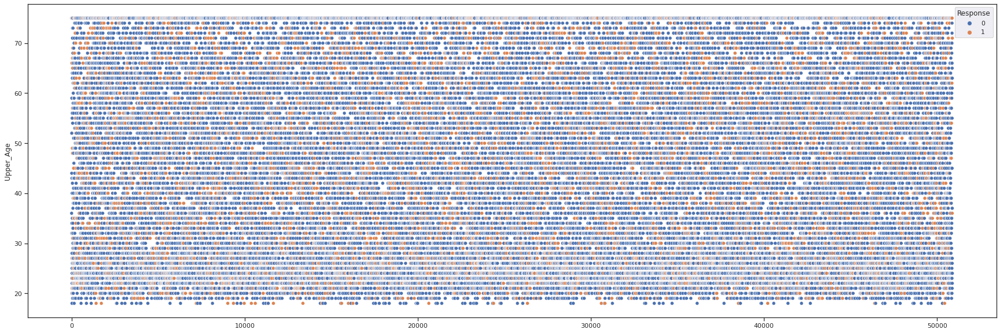

In [49]:
sns.set_style('ticks')
fig, ax = plt.subplots()
fig.set_size_inches(30, 10)
sns.set_theme(style="darkgrid")
sns.scatterplot(df.index, df.Upper_Age, hue=df.Response)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


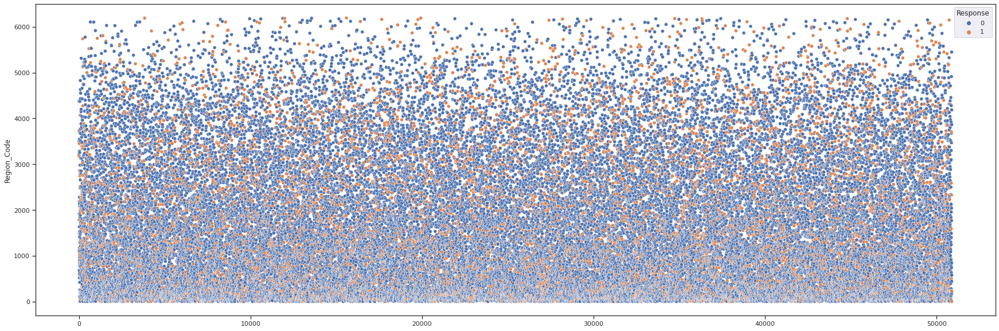

In [27]:
sns.set_style('ticks')
fig, ax = plt.subplots()
fig.set_size_inches(30, 10)
sns.set_theme(style="darkgrid")
sns.scatterplot(df.index, df.Region_Code, hue=df.Response)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


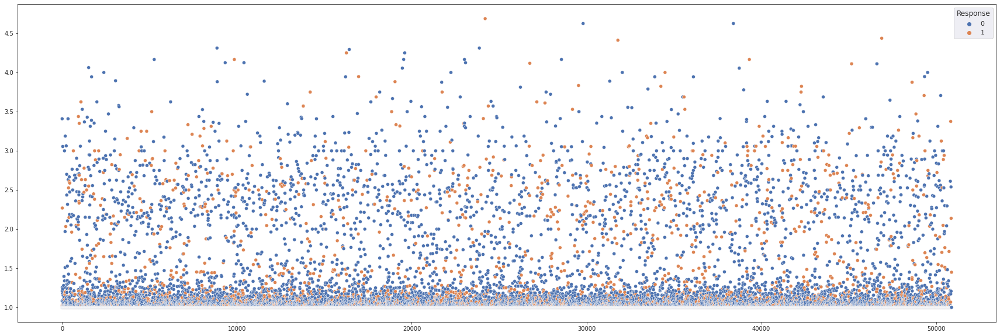

In [3]:
sns.set_style('ticks')
fig, ax = plt.subplots()
fig.set_size_inches(30, 10)
sns.set_theme(style="darkgrid")
sns.scatterplot(df.index, df.Upper_Age/df.Lower_Age, hue=df.Response)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


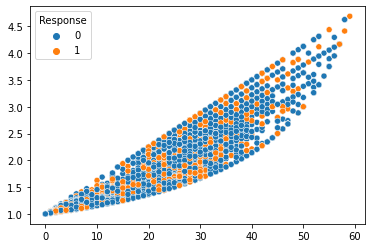

In [3]:
sns.scatterplot(df.Upper_Age-df.Lower_Age, df.Upper_Age/df.Lower_Age, hue=df.Response)

In [25]:
df.Is_Spouse.value_counts()

No     42460
Yes     8422
Name: Is_Spouse, dtype: int64

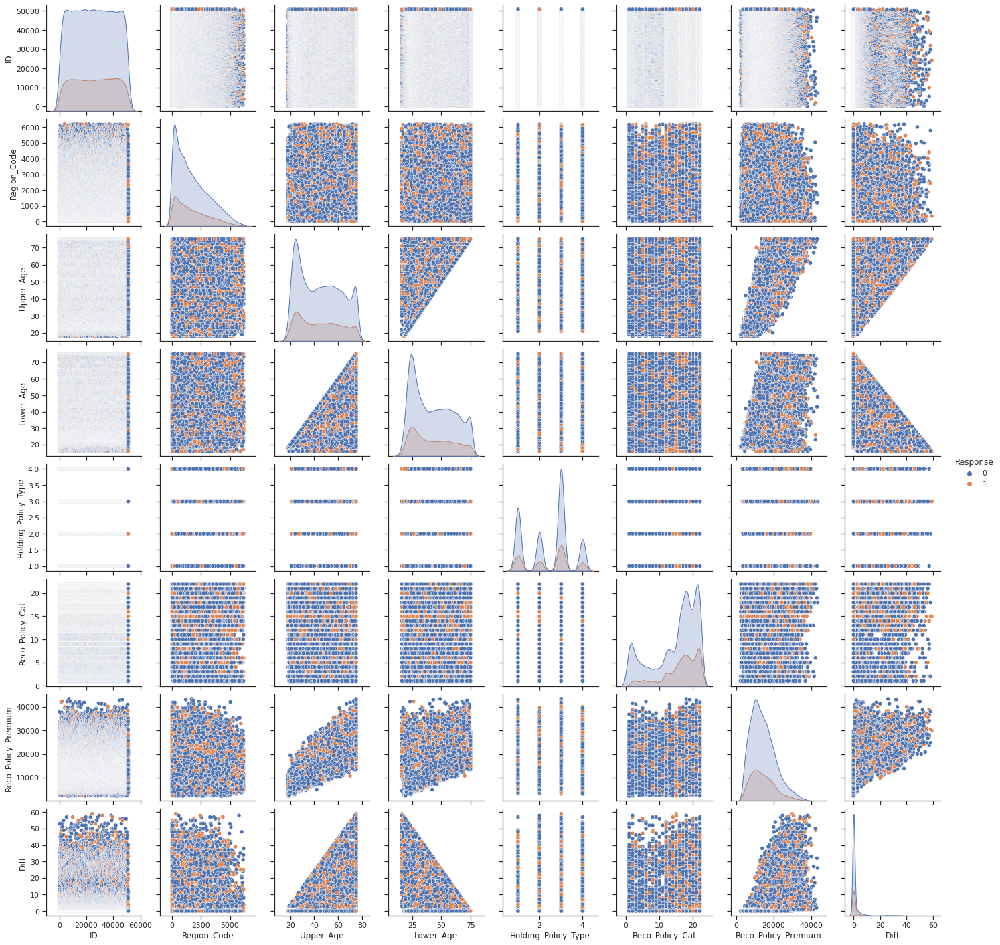

In [24]:
sns.set(style="ticks", color_codes=True)
sns.pairplot(df, hue='Response')

---

In [96]:
X_train.head()

,ID,City_Code,Region_Code,Accomodation_Type,Reco_Insurance_Type,Upper_Age,Lower_Age,Is_Spouse,Health Indicator,Holding_Policy_Duration,Holding_Policy_Type,Reco_Policy_Cat,Reco_Policy_Premium,Diff
1446,1447,C4,865,Rented,Individual,25,25,No,NaN,1.0,1.0,21,11448.0,0
33681,33682,C20,2468,Owned,Individual,41,41,No,NaN,NaN,NaN,14,12360.0,0
12441,12442,C8,642,Rented,Individual,24,24,No,X3,NaN,NaN,12,3402.0,0
26778,26779,C14,1111,Rented,Individual,28,28,No,X1,3.0,3.0,11,9920.0,0
4227,4228,C6,400,Rented,Individual,23,23,No,X2,2.0,1.0,15,4720.0,0


In [45]:
train_df = df.fillna(0)
test_df = pd.read_csv('test_YCcRUnU.csv')

In [46]:
train_df.drop(['ID', 'Region_Code'], axis=1, inplace=True)
train_df.head()

,City_Code,Accomodation_Type,Reco_Insurance_Type,Upper_Age,Lower_Age,Is_Spouse,Health Indicator,Holding_Policy_Duration,Holding_Policy_Type,Reco_Policy_Cat,Reco_Policy_Premium,Response
0,C3,Rented,Individual,36,36,No,X1,14+,3.0,22,11628.0,0
1,C5,Owned,Joint,75,22,No,X2,0,0.0,22,30510.0,0
2,C5,Owned,Individual,32,32,No,0,1.0,1.0,19,7450.0,1
3,C24,Owned,Joint,52,48,No,X1,14+,3.0,19,17780.0,0
4,C8,Rented,Individual,44,44,No,X2,3.0,1.0,16,10404.0,0


In [47]:
test_df = test_df.fillna(0)
test_df.drop(['ID', 'Region_Code'], axis=1, inplace=True)
test_df.head()
test_df['Diff'] = test_df.Upper_Age - test_df.Lower_Age
test_df.head()

,City_Code,Accomodation_Type,Reco_Insurance_Type,Upper_Age,Lower_Age,Is_Spouse,Health Indicator,Holding_Policy_Duration,Holding_Policy_Type,Reco_Policy_Cat,Reco_Policy_Premium,Diff
0,C1,Owned,Individual,30,30,No,0,6.0,3.0,5,11934.0,0
1,C4,Owned,Joint,69,68,Yes,X1,3.0,3.0,18,32204.8,1
2,C1,Rented,Individual,28,28,No,X3,2.0,4.0,17,9240.0,0
3,C3,Rented,Individual,23,23,No,X3,3.0,3.0,18,9086.0,0
4,C1,Owned,Individual,75,75,No,X3,0,0.0,5,22534.0,0


In [48]:
#Frequency encoding
encode_these = ['City_Code',	'Accomodation_Type',	'Reco_Insurance_Type', 'Health Indicator',	'Holding_Policy_Duration']
l = len(train_df)
for feature in encode_these:
  enc = (train_df.groupby(feature).size()) / len(train_df)
  train_df[feature] = train_df[feature].apply(lambda x : enc[x])
  test_df[feature] = test_df[feature].apply(lambda x : enc[x])
train_df.head()

,City_Code,Accomodation_Type,Reco_Insurance_Type,Upper_Age,Lower_Age,Is_Spouse,Health Indicator,Holding_Policy_Duration,Holding_Policy_Type,Reco_Policy_Cat,Reco_Policy_Premium,Response
0,0.096085,0.45067,0.796667,36,36,No,0.255690,0.085197,3.0,22,11628.0,0
1,0.026807,0.54933,0.203333,75,22,No,0.203058,0.397999,0.0,22,30510.0,0
2,0.026807,0.54933,0.796667,32,32,No,0.229767,0.088420,1.0,19,7450.0,1
3,0.010868,0.54933,0.203333,52,48,No,0.255690,0.085197,3.0,19,17780.0,0
4,0.035494,0.45067,0.796667,44,44,No,0.203058,0.070477,1.0,16,10404.0,0


In [49]:
test_df.head()

,City_Code,Accomodation_Type,Reco_Insurance_Type,Upper_Age,Lower_Age,Is_Spouse,Health Indicator,Holding_Policy_Duration,Holding_Policy_Type,Reco_Policy_Cat,Reco_Policy_Premium,Diff
0,0.176349,0.54933,0.796667,30,30,No,0.229767,0.037223,3.0,5,11934.0,0
1,0.072147,0.54933,0.203333,69,68,Yes,0.255690,0.070477,3.0,18,32204.8,1
2,0.176349,0.45067,0.796667,28,28,No,0.132896,0.083723,4.0,17,9240.0,0
3,0.096085,0.45067,0.796667,23,23,No,0.132896,0.070477,3.0,18,9086.0,0
4,0.176349,0.54933,0.796667,75,75,No,0.132896,0.397999,0.0,5,22534.0,0


In [50]:
#is_spouse
test_df['Is_Spouse'] = test_df['Is_Spouse'].map({'Yes':1, 'No':0})
train_df['Is_Spouse'] = train_df['Is_Spouse'].map({'Yes':1, 'No':0})
train_df.head()

,City_Code,Accomodation_Type,Reco_Insurance_Type,Upper_Age,Lower_Age,Is_Spouse,Health Indicator,Holding_Policy_Duration,Holding_Policy_Type,Reco_Policy_Cat,Reco_Policy_Premium,Response
0,0.096085,0.45067,0.796667,36,36,0,0.255690,0.085197,3.0,22,11628.0,0
1,0.026807,0.54933,0.203333,75,22,0,0.203058,0.397999,0.0,22,30510.0,0
2,0.026807,0.54933,0.796667,32,32,0,0.229767,0.088420,1.0,19,7450.0,1
3,0.010868,0.54933,0.203333,52,48,0,0.255690,0.085197,3.0,19,17780.0,0
4,0.035494,0.45067,0.796667,44,44,0,0.203058,0.070477,1.0,16,10404.0,0


In [51]:
train_df['Diff'] = train_df.Upper_Age - train_df.Lower_Age

In [52]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50882 entries, 0 to 50881
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   City_Code                50882 non-null  float64
 1   Accomodation_Type        50882 non-null  float64
 2   Reco_Insurance_Type      50882 non-null  float64
 3   Upper_Age                50882 non-null  int64  
 4   Lower_Age                50882 non-null  int64  
 5   Is_Spouse                50882 non-null  int64  
 6   Health Indicator         50882 non-null  float64
 7   Holding_Policy_Duration  50882 non-null  float64
 8   Holding_Policy_Type      50882 non-null  float64
 9   Reco_Policy_Cat          50882 non-null  int64  
 10  Reco_Policy_Premium      50882 non-null  float64
 11  Response                 50882 non-null  int64  
 12  Diff                     50882 non-null  int64  
dtypes: float64(7), int64(6)
memory usage: 5.0 MB


In [53]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21805 entries, 0 to 21804
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   City_Code                21805 non-null  float64
 1   Accomodation_Type        21805 non-null  float64
 2   Reco_Insurance_Type      21805 non-null  float64
 3   Upper_Age                21805 non-null  int64  
 4   Lower_Age                21805 non-null  int64  
 5   Is_Spouse                21805 non-null  int64  
 6   Health Indicator         21805 non-null  float64
 7   Holding_Policy_Duration  21805 non-null  float64
 8   Holding_Policy_Type      21805 non-null  float64
 9   Reco_Policy_Cat          21805 non-null  int64  
 10  Reco_Policy_Premium      21805 non-null  float64
 11  Diff                     21805 non-null  int64  
dtypes: float64(7), int64(5)
memory usage: 2.0 MB


In [54]:
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
X_train, X_test, y_train, y_test = train_test_split(train_df.drop(['Response'],axis=1), train_df.Response, test_size=0.30, random_state=42)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(35617, 12)
(15265, 12)
(35617,)
(15265,)


In [55]:
xgb = RandomForestClassifier()
xgb.fit(X_train, y_train)
from sklearn.metrics import roc_auc_score
xgb.score(X_train, y_train)

0.9999438470393351

In [56]:
xgb.score(X_test, y_test)

0.7505404520144121

In [70]:
sub = pd.read_csv('/content/sample_submission_QrCyCoT.csv')
sub.head()

,ID,Response
0,50883,0
1,50884,0
2,50885,0
3,50886,0
4,50887,0


In [71]:
preds = xgb.predict_proba(test_df)
sub.Response = preds[:,0]
#sub.to_csv('av_sub.csv', index=False)

In [72]:
sub.Response = sub.Response.map(fix_thresh)
sub.head()

,ID,Response
0,50883,1
1,50884,1
2,50885,0
3,50886,1
4,50887,0


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


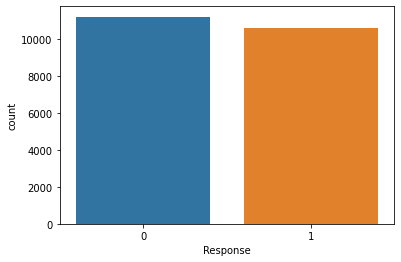

In [73]:
sns.countplot(sub.Response)

In [74]:
sub.Response = xgb.predict(test_df)
sub.to_csv('av_sub_rfr73.csv', index=False)

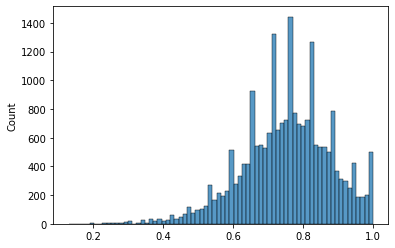

In [60]:
sns.histplot(xgb.predict_proba(test_df)[:,0])

In [69]:
def fix_thresh(x):
  if x <= 0.75:
    return 1
  else:
    return 0